# ECSE 415 - Assignment 3: Advanced Computer Vision


Mathieu-Joseph Magri, 260928498

In [3]:
#Import Statements
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from skimage.feature import hog
import os
import random
import pickle
import scipy as sp



#Google Drive Mount
from google.colab import drive
drive.mount('/content/drive')

#Path Variable for images
path = '/content/drive/MyDrive/ECSE_415/Assignments/A3/Assignment3/'

Mounted at /content/drive


## Question 1: Image Classification with Convolution Neural Network (CNN) and Naïve Bayes [53 points]

In [17]:
#DON'T FORGET TO CHANGE THE RUN SETTING TO GPU BEFORE RUNNING THE CNN!

#Import statements
import torch
import torchvision
import torchvision.transforms as transforms

#Take GPU if available
if torch.cuda.is_available():  
  dev = "cuda:0" 
else:  
  dev = "cpu"  
print(dev)
device = torch.device(dev)  

#A LOT OF THE FOLLOWING CODE COMES FROM THE PYTOCH/CIFAR10 TUTORIAL!
#1.1: Use Pytorch class torchvision.datasets.MNIST to (down)load the dataset. Use batch size of 32.

# transform = transforms.Compose([transforms.ToTensor(),
# transforms.Normalize((0.5,), (0.5,))
# ])

transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=32,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 


cuda:0


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



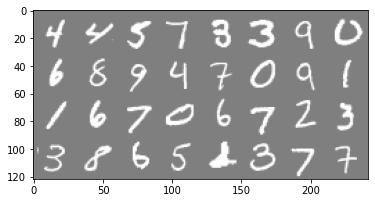

    4     4     5     7     3     3     9     0     6     8     9     4     7     0     9     1     1     6     7     0     6     7     2     3     3     8     6     5     2     3     7     7
torch.Size([1, 28, 28])


In [ ]:
#Plotting images for debugging purposes:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# get some random training images
dataiter = iter(trainloader)     #Creates an iterator over the images
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels, Print out 1 batch so 32 images!
print(' '.join('%5s' % classes[labels[j]] for j in range(32)))
print(images[0].shape)

In [10]:
#1.2: Implement a CNN with the layers mentioned below.
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


net = Net()



In [11]:
#1.3: Create an instance of SGD optimizer with learning rate of 0.001. 
#Use the default setting for rest of the hyperparameters. Create an instance of categorical cross entropy criterion. 
import torch.optim as optim #There are a bunch of loss functions and optomizers

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001)


In [12]:
#1.4: Train the CNN for 10 epochs. Display loss and accuracy in each training step.

torch.cuda.empty_cache()

#Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#Basic Accuracy Function:
def accuracy(y_pred, y_true):
    acc = torch.sum((y_true == y_pred).float()) / len(y_true)
    return acc

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 180 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

Epoch [1/10], Step [180/1875] Loss: 2.3077 Accuracy: 0.0938
Epoch [1/10], Step [360/1875] Loss: 2.2995 Accuracy: 0.2188
Epoch [1/10], Step [540/1875] Loss: 2.2909 Accuracy: 0.2188
Epoch [1/10], Step [720/1875] Loss: 2.2964 Accuracy: 0.1562
Epoch [1/10], Step [900/1875] Loss: 2.2845 Accuracy: 0.3438
Epoch [1/10], Step [1080/1875] Loss: 2.2821 Accuracy: 0.3125
Epoch [1/10], Step [1260/1875] Loss: 2.2667 Accuracy: 0.2500
Epoch [1/10], Step [1440/1875] Loss: 2.2500 Accuracy: 0.4062
Epoch [1/10], Step [1620/1875] Loss: 2.2107 Accuracy: 0.4062
Epoch [1/10], Step [1800/1875] Loss: 2.1407 Accuracy: 0.6562
Epoch [2/10], Step [180/1875] Loss: 1.7786 Accuracy: 0.6562
Epoch [2/10], Step [360/1875] Loss: 1.1191 Accuracy: 0.7812
Epoch [2/10], Step [540/1875] Loss: 0.7665 Accuracy: 0.7188
Epoch [2/10], Step [720/1875] Loss: 0.4018 Accuracy: 0.8750
Epoch [2/10], Step [900/1875] Loss: 0.6319 Accuracy: 0.8750
Epoch [2/10], Step [1080/1875] Loss: 0.2625 Accuracy: 0.9375
Epoch [2/10], Step [1260/1875] Los

In [13]:
#1.5: Predict labels of the test images using the above trained CNN. Report classification accuracy.
#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

Accuracy of the model on the test images: 96.69 %


In [ ]:
#1.6: Show the effect of batch size on the classification accuracy of test images. 
#Use a minimum of 4 different batch sizes (i.e. batch size = 4, 8, 12, 16). (you will need to re-train the model)

#USING BATCH SIZE OF 4
transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

#New Untrained Model
class Net4(nn.Module):
    def __init__(self):
        super(Net4, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


net4 = Net4()

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = net4(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 1500 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = net4(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))


Epoch [1/10], Step [1500/15000] Loss: 2.2947 Accuracy: 0.5000
Epoch [1/10], Step [3000/15000] Loss: 2.3083 Accuracy: 0.0000
Epoch [1/10], Step [4500/15000] Loss: 2.3012 Accuracy: 0.2500
Epoch [1/10], Step [6000/15000] Loss: 2.3066 Accuracy: 0.2500
Epoch [1/10], Step [7500/15000] Loss: 2.3044 Accuracy: 0.0000
Epoch [1/10], Step [9000/15000] Loss: 2.3069 Accuracy: 0.0000
Epoch [1/10], Step [10500/15000] Loss: 2.3055 Accuracy: 0.0000
Epoch [1/10], Step [12000/15000] Loss: 2.3149 Accuracy: 0.0000
Epoch [1/10], Step [13500/15000] Loss: 2.3304 Accuracy: 0.0000
Epoch [1/10], Step [15000/15000] Loss: 2.3026 Accuracy: 0.0000
Epoch [2/10], Step [1500/15000] Loss: 2.2894 Accuracy: 0.5000
Epoch [2/10], Step [3000/15000] Loss: 2.3010 Accuracy: 0.0000
Epoch [2/10], Step [4500/15000] Loss: 2.3090 Accuracy: 0.2500
Epoch [2/10], Step [6000/15000] Loss: 2.3052 Accuracy: 0.0000
Epoch [2/10], Step [7500/15000] Loss: 2.3042 Accuracy: 0.0000
Epoch [2/10], Step [9000/15000] Loss: 2.2960 Accuracy: 0.2500
Epoc

In [ ]:
#1.6: Show the effect of batch size on the classification accuracy of test images. 
#Use a minimum of 4 different batch sizes (i.e. batch size = 4, 8, 12, 16). (you will need to re-train the model)

#USING BATCH SIZE OF 8
transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=8, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=8,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

#New Untrained Model
class Net8(nn.Module):
    def __init__(self):
        super(Net8, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


net8 = Net8()

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = net8(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 750 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = net8(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

Epoch [1/10], Step [750/7500] Loss: 2.3084 Accuracy: 0.1250
Epoch [1/10], Step [1500/7500] Loss: 2.3029 Accuracy: 0.1250
Epoch [1/10], Step [2250/7500] Loss: 2.2911 Accuracy: 0.2500
Epoch [1/10], Step [3000/7500] Loss: 2.3129 Accuracy: 0.0000
Epoch [1/10], Step [3750/7500] Loss: 2.3159 Accuracy: 0.0000
Epoch [1/10], Step [4500/7500] Loss: 2.2995 Accuracy: 0.2500
Epoch [1/10], Step [5250/7500] Loss: 2.3020 Accuracy: 0.1250
Epoch [1/10], Step [6000/7500] Loss: 2.3101 Accuracy: 0.0000
Epoch [1/10], Step [6750/7500] Loss: 2.2977 Accuracy: 0.2500
Epoch [1/10], Step [7500/7500] Loss: 2.2901 Accuracy: 0.1250
Epoch [2/10], Step [750/7500] Loss: 2.3099 Accuracy: 0.1250
Epoch [2/10], Step [1500/7500] Loss: 2.3021 Accuracy: 0.2500
Epoch [2/10], Step [2250/7500] Loss: 2.3034 Accuracy: 0.1250
Epoch [2/10], Step [3000/7500] Loss: 2.3008 Accuracy: 0.0000
Epoch [2/10], Step [3750/7500] Loss: 2.3060 Accuracy: 0.0000
Epoch [2/10], Step [4500/7500] Loss: 2.3139 Accuracy: 0.0000
Epoch [2/10], Step [5250/7

In [ ]:
#1.6: Show the effect of batch size on the classification accuracy of test images. 
#Use a minimum of 4 different batch sizes (i.e. batch size = 4, 8, 12, 16). (you will need to re-train the model)

#USING BATCH SIZE OF 12
transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=12, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=12,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

#New Untrained Model
class Net12(nn.Module):
    def __init__(self):
        super(Net12, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


net12 = Net12()

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = net12(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 500 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = net12(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

Epoch [1/10], Step [500/5000] Loss: 2.3041 Accuracy: 0.0833
Epoch [1/10], Step [1000/5000] Loss: 2.2926 Accuracy: 0.3333
Epoch [1/10], Step [1500/5000] Loss: 2.3029 Accuracy: 0.0000
Epoch [1/10], Step [2000/5000] Loss: 2.3056 Accuracy: 0.0833
Epoch [1/10], Step [2500/5000] Loss: 2.3080 Accuracy: 0.0833
Epoch [1/10], Step [3000/5000] Loss: 2.2981 Accuracy: 0.2500
Epoch [1/10], Step [3500/5000] Loss: 2.3012 Accuracy: 0.0833
Epoch [1/10], Step [4000/5000] Loss: 2.3089 Accuracy: 0.0000
Epoch [1/10], Step [4500/5000] Loss: 2.3049 Accuracy: 0.0000
Epoch [1/10], Step [5000/5000] Loss: 2.3013 Accuracy: 0.1667
Epoch [2/10], Step [500/5000] Loss: 2.3035 Accuracy: 0.0000
Epoch [2/10], Step [1000/5000] Loss: 2.3086 Accuracy: 0.0833
Epoch [2/10], Step [1500/5000] Loss: 2.3119 Accuracy: 0.0833
Epoch [2/10], Step [2000/5000] Loss: 2.3031 Accuracy: 0.0833
Epoch [2/10], Step [2500/5000] Loss: 2.3018 Accuracy: 0.0000
Epoch [2/10], Step [3000/5000] Loss: 2.2967 Accuracy: 0.1667
Epoch [2/10], Step [3500/5

In [8]:
#1.6: Show the effect of batch size on the classification accuracy of test images. 
#Use a minimum of 4 different batch sizes (i.e. batch size = 4, 8, 12, 16). (you will need to re-train the model)

#USING BATCH SIZE OF 16
transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=16, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=16,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

#Basic Accuracy Function:
def accuracy(y_pred, y_true):
    acc = torch.sum((y_true == y_pred).float()) / len(y_true)
    return acc


#New Untrained Model
class Net16(nn.Module):
    def __init__(self):
        super(Net16, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.relu(self.conv2(F.relu(self.conv1(x)))))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


net16 = Net16()

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = net16(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 375 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = net16(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

Epoch [1/10], Step [375/3750] Loss: 2.3008 Accuracy: 0.0000
Epoch [1/10], Step [750/3750] Loss: 2.3032 Accuracy: 0.0625
Epoch [1/10], Step [1125/3750] Loss: 2.3009 Accuracy: 0.0000
Epoch [1/10], Step [1500/3750] Loss: 2.3046 Accuracy: 0.1875
Epoch [1/10], Step [1875/3750] Loss: 2.3054 Accuracy: 0.0625
Epoch [1/10], Step [2250/3750] Loss: 2.2995 Accuracy: 0.3125
Epoch [1/10], Step [2625/3750] Loss: 2.3022 Accuracy: 0.0000
Epoch [1/10], Step [3000/3750] Loss: 2.3002 Accuracy: 0.1875
Epoch [1/10], Step [3375/3750] Loss: 2.3019 Accuracy: 0.1875
Epoch [1/10], Step [3750/3750] Loss: 2.3008 Accuracy: 0.1250
Epoch [2/10], Step [375/3750] Loss: 2.2992 Accuracy: 0.1250
Epoch [2/10], Step [750/3750] Loss: 2.3024 Accuracy: 0.3125
Epoch [2/10], Step [1125/3750] Loss: 2.3020 Accuracy: 0.0625
Epoch [2/10], Step [1500/3750] Loss: 2.3041 Accuracy: 0.0625
Epoch [2/10], Step [1875/3750] Loss: 2.3056 Accuracy: 0.0625
Epoch [2/10], Step [2250/3750] Loss: 2.3015 Accuracy: 0.0625
Epoch [2/10], Step [2625/375

**As we increase the Batch Size, it seems that the test accuracy increases. This seems to be the expected behaviour when training a network.**

In [9]:
#1.7:Mention 2 other activation functions other than ReLU. Re-train the model using these activation functions instead of ReLU (throughout the network) 
#and report the test classification accuracies. Discuss the results.

#There are many other possible activation functions that can be used. For this first modified model, we will be using Leaky_Relu 
#and then Hyperbolic Tangent (Tanh)

transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=32,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

import torch.nn as nn
import torch.nn.functional as F

#leaky_relu
class NetLR(nn.Module):
    def __init__(self):
        super(NetLR, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.leaky_relu(self.conv2(F.leaky_relu(self.conv1(x)))))
        x = F.leaky_relu(self.conv3(x))
        x = F.leaky_relu(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


netLR = NetLR()

torch.cuda.empty_cache()

#Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#Basic Accuracy Function:
def accuracy(y_pred, y_true):
    acc = torch.sum((y_true == y_pred).float()) / len(y_true)
    return acc

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = netLR(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 180 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = netLR(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))


Epoch [1/10], Step [180/1875] Loss: 2.3082 Accuracy: 0.0312
Epoch [1/10], Step [360/1875] Loss: 2.3018 Accuracy: 0.0938
Epoch [1/10], Step [540/1875] Loss: 2.3024 Accuracy: 0.1250
Epoch [1/10], Step [720/1875] Loss: 2.3033 Accuracy: 0.1562
Epoch [1/10], Step [900/1875] Loss: 2.3048 Accuracy: 0.0625
Epoch [1/10], Step [1080/1875] Loss: 2.3034 Accuracy: 0.0938
Epoch [1/10], Step [1260/1875] Loss: 2.3023 Accuracy: 0.0625
Epoch [1/10], Step [1440/1875] Loss: 2.3063 Accuracy: 0.0938
Epoch [1/10], Step [1620/1875] Loss: 2.3055 Accuracy: 0.1250
Epoch [1/10], Step [1800/1875] Loss: 2.3042 Accuracy: 0.0938
Epoch [2/10], Step [180/1875] Loss: 2.3004 Accuracy: 0.1250
Epoch [2/10], Step [360/1875] Loss: 2.3085 Accuracy: 0.0625
Epoch [2/10], Step [540/1875] Loss: 2.3009 Accuracy: 0.1250
Epoch [2/10], Step [720/1875] Loss: 2.3030 Accuracy: 0.1250
Epoch [2/10], Step [900/1875] Loss: 2.3014 Accuracy: 0.0625
Epoch [2/10], Step [1080/1875] Loss: 2.3042 Accuracy: 0.0625
Epoch [2/10], Step [1260/1875] Los

In [10]:
#1.7:Mention 2 other activation functions other than ReLU. Re-train the model using these activation functions instead of ReLU (throughout the network) 
#and report the test classification accuracies. Discuss the results.

#There are many other possible activation functions that can be used. For this first modified model, we will be using Leaky_Relu 
#and then Hyperbolic Tangent (Tanh)

transform = transforms.Compose(
    [transforms.ToTensor()])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True, num_workers=2)

testset = torchvision.datasets.MNIST(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=32,       #Convert into small batches since we wouldn't have enough memory to analyze everything otherwise
                                         shuffle=False, num_workers=2)

classes = ('0', '1', '2', '3',
           '4', '5', '6', '7', '8', '9') 

import torch.nn as nn
import torch.nn.functional as F

#tanh
class NetT(nn.Module):
    def __init__(self):
        super(NetT, self).__init__()
        #A convolution layer with 32 kernels of size 3 × 3
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 3)) # nn.conv2d(input_num_channels, output_channels, kernel_size)
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3))
        #A maxpool layer with kernels of size 2 × 2.
        self.pool1 = nn.MaxPool2d(2, 2) 
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A convolution layer with 64 kernels of size 3 × 3.
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=(3, 3))
        #A flattening layer. (This layer resizes 2D feature map to a feature vector. The length of this feature vector should be 4096.)
        self.fl1 = nn.Flatten()
        #A Linear layer with output size of 10.
        self.fc1 = nn.Linear(in_features = 4096, out_features = 10)


    def forward(self, x): #x (batch_size, 28, 28, 1)
        #CONV -> RELU -> CONV -> RELU -> MAXPOOL
        x = self.pool1(F.tanh(self.conv2(F.tanh(self.conv1(x)))))
        x = F.tanh(self.conv3(x))
        x = F.tanh(self.conv4(x))
        x = self.fl1(x)
        x = self.fc1(x)
        return x


netT = NetT()

torch.cuda.empty_cache()

#Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#Basic Accuracy Function:
def accuracy(y_pred, y_true):
    acc = torch.sum((y_true == y_pred).float()) / len(y_true)
    return acc

#Train the model
total_step = len(trainloader)
for epoch in range(10):
    for i, data in enumerate(trainloader):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # inputs, labels = inputs.to(device), labels.to(device)
        inputs, labels = data
        #Forward pass
        outputs = netT(inputs)
        loss = criterion(outputs, labels)

        #Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if (i+1) % 180 == 0:
            _, predicted = torch.max(outputs, 1)
            print ("Epoch [{}/{}], Step [{}/{}] Loss: {:.4f} Accuracy: {:.4f}"
                   .format(epoch+1, 10, i+1, total_step, loss.item(), accuracy(predicted, labels)))
            
print('Finished Training')

#Test the model
#Model.eval() will turn model to eval mode where batch normalization will not update its mean and std
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testloader:
        outputs = netT(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))


/usr/local/lib/python3.9/dist-packages/torch/nn/functional.py:1956: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


Epoch [1/10], Step [180/1875] Loss: 2.2997 Accuracy: 0.1875
Epoch [1/10], Step [360/1875] Loss: 2.3093 Accuracy: 0.1250
Epoch [1/10], Step [540/1875] Loss: 2.3019 Accuracy: 0.0938
Epoch [1/10], Step [720/1875] Loss: 2.3001 Accuracy: 0.1250
Epoch [1/10], Step [900/1875] Loss: 2.3101 Accuracy: 0.0625
Epoch [1/10], Step [1080/1875] Loss: 2.3142 Accuracy: 0.0000
Epoch [1/10], Step [1260/1875] Loss: 2.2989 Accuracy: 0.2188
Epoch [1/10], Step [1440/1875] Loss: 2.3016 Accuracy: 0.1250
Epoch [1/10], Step [1620/1875] Loss: 2.3176 Accuracy: 0.0938
Epoch [1/10], Step [1800/1875] Loss: 2.3122 Accuracy: 0.1250
Epoch [2/10], Step [180/1875] Loss: 2.3062 Accuracy: 0.0625
Epoch [2/10], Step [360/1875] Loss: 2.2985 Accuracy: 0.1562
Epoch [2/10], Step [540/1875] Loss: 2.3057 Accuracy: 0.1250
Epoch [2/10], Step [720/1875] Loss: 2.3024 Accuracy: 0.1562
Epoch [2/10], Step [900/1875] Loss: 2.3090 Accuracy: 0.0938
Epoch [2/10], Step [1080/1875] Loss: 2.3029 Accuracy: 0.0938
Epoch [2/10], Step [1260/1875] Los

**As we can see, the activation functions have a major influence on the accuracy of the model. Using Leaky ReLu (9.48 %) and the Tanh (9.17 %) activation function, we notice that our accuracy decreases dramatically when compared to the network that used the ReLu (96.69 %) activation function.**

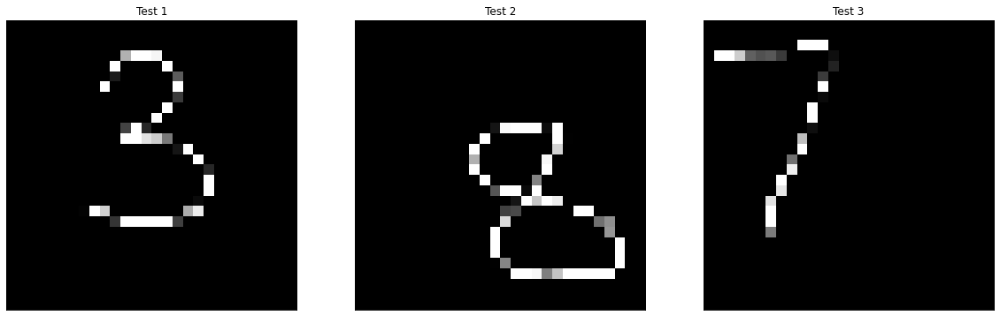

Test 1 prediction: tensor(3)
Test 2 prediction: tensor(7)
Test 3 prediction: tensor(4)


In [17]:
#1.8: Now, use the CNN developed above to recognize the digit in the test images (see Figure 1) 
#- ‘test1.png’, ‘test2.png’ and ‘test3.png’. Include the details of the important steps. 
#(You may need to pre-process the input image before using CNN to recognized the digit)

#Load images
test1 = cv2.imread(path+'test1.png') #BGR image
test1 = cv2.cvtColor(test1, cv2.COLOR_BGR2RGB)

test2 = cv2.imread(path+'test2.png') #BGR image
test2 = cv2.cvtColor(test2, cv2.COLOR_BGR2RGB)

test3 = cv2.imread(path+'test3.png') #BGR image
test3 = cv2.cvtColor(test3, cv2.COLOR_BGR2RGB)

#FIRST STEP OF PREPROCESSING -> CONVERT TO BLACK AND WHITE
test1 = cv2.cvtColor(test1, cv2.COLOR_BGR2GRAY)
test2 = cv2.cvtColor(test2, cv2.COLOR_BGR2GRAY)
test3 = cv2.cvtColor(test3, cv2.COLOR_BGR2GRAY)

#SECOND STEP OF PREPROCESSING -> INVERSE COLORS (WHITW TO BLACK AND BLACK TO WHITE)
test1 = cv2.bitwise_not(test1)
test2 = cv2.bitwise_not(test2)
test3 = cv2.bitwise_not(test3)

#THIRD STEP OF PREPROCESSING -> RESIZE IMAGE TO CORRECT DIMENSIONS
# print("Size of test 1:", test1.shape)
# print("Size of test 2:", test2.shape)
# print("Size of test 3:", test3.shape)

#dim is (width, height)
test1 = cv2.resize(test1, (28,28))
test2 = cv2.resize(test2, (28,28))
test3 = cv2.resize(test3, (28,28))

# print("Size of test 1:", test1.shape)
# print("Size of test 2:", test2.shape)
# print("Size of test 3:", test3.shape)

#Display
plt.figure(figsize=(20,20))
plt.subplot(131), plt.imshow(test1, cmap="gray")
plt.title("Test 1"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(test2, cmap="gray")
plt.title("Test 2"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(test3, cmap="gray")
plt.title("Test 3"), plt.xticks([]), plt.yticks([])
plt.show()


#Test images
testImages = [test1, test2, test3]
testLabels = ['3', '8', '7']

t1 = torch.tensor(test1, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)
t2 = torch.tensor(test2, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)
t3 = torch.tensor(test3, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)

# with torch.no_grad():
#     correct = 0
#     total = 0
#     for images, labels in testloader:
#         outputs = net(images)
#         _, predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()

#     print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

label1 = net(t1)
label2 = net(t2)
label3 = net(t3)

_, label1 = torch.max(label1, 1)
_, label2 = torch.max(label2, 1)
_, label3 = torch.max(label3, 1)

print("Test 1 prediction:", label1[0])
print("Test 2 prediction:", label2[0])
print("Test 3 prediction:", label3[0])

As we can see, the first image is classified correctly, while the last two images are not classified correctly. The network therefore has a success rate of 1/3 on these specific test images.

In [41]:
#1.9: Implement a probabilistic classifier that makes a Naïve Bayes assumption for the likelihood. Assume that you have a uniform prior. 
#Now using this classifier, infer (i.e. mention the posterior probability for each class) on the handwritten test image in figure 1. 
#(You can use the numpy library to answer this sub-question (only for this sub-question))

##################################################################################################################################################
#FOR 1.9 and 1.10 I HAVE USED THE FOLLOWING SOURCE CODE TO BUILD THE NAIVES BAYES MODEL, THE FOLLOWING CODE IS HEAVILY INSPIRED FROM IT!:        #
#https://github.com/Arnab-0901/Classification-Algorithms/blob/master/Naive%20Bayes%20on%20MNIST.ipynb                                            #
##################################################################################################################################################
#Imports
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import datasets
from sklearn.metrics import classification_report
from tqdm import tqdm
from time import time
from keras.datasets import mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train=x_train.reshape(60000,784)
x_test=x_test.reshape(10000,784)
data=np.zeros([70000,784])
data[:60000,:]=x_train; data[60000:,:]=x_test
label=np.zeros(70000)
label[:60000]=y_train; label[60000:]=y_test

def naive_bayes(data,label):
    n_s,n_f=data.shape          #Find the Shape (Samples,Features) of the data
    classes=np.unique(label)    #Find the Unique Classes in the Data
    n_c=len(classes)            #Number of Classes in the Data
    total_data=np.zeros([n_s,n_f+1]) #Create a Zero Matrix with (Samples,Feature+1) dimensions
    total_data[:,:-1]=data           #Save the samples & features in the total_data matrix
    total_data[:,-1]=label           #Save the Labels in the total_data matrix
    np.random.shuffle(total_data)    #Shuffle the total_data Matrix (Sample & Label) are sampled together
    trainX=total_data[:60000,:]      #Train Data is taken from total Data
    np.random.shuffle(trainX)        #Train Data is shuffled once again        
    testX=total_data[60000:,:]       #Test Data is taken from Total Data
    np.random.shuffle(testX)         #Test Data is shuffled once again
    testX_c=testX[:,:-1]             #Take the samples and feature from Test Data
    testX_l=testX[:,-1]              #Take the labels from Test Data
    mean_v=np.zeros([n_c,n_f])       #Take a Zero Matrix that will be used to store the mean of Features wrt classes
    var_v=np.zeros([n_c,n_f])        #Take a Zero Matrix that will be used to store the variance of Features wrt classes
    c_prob=[]                        #list to store P(class)
    confusion_matrix=np.zeros([n_c,n_c]) #Take a Zero Matrix for Confusion MAtrix of size (classes*classes)
    d_acc=[]                         #Take a list that will save each class(digit) accuracy
    
    for c in classes:
        trainX_c=trainX[trainX[:,-1]==c]   #Filter samples for each class
        trainX_c=trainX_c[:,:-1]           #
        c_prob.append(0.1) #USING A UNIFORM PRIOR
        mean_v[int(c),:]=trainX_c.mean(axis=0)#Find mean of each class & save in corresonding mean matrix
        var_v[int(c),:]=trainX_c.var(axis=0)#Find variance of each class & save in corresonding mean matrix
    
    var_v=var_v+1000    #Since variance is 0 for many pixels, we need to add some value to the variance. 
                        #Adding 1000 gives one of the best accuracies
    count=0             
    
    for i in range(testX.shape[0]):
        lists=[]   #Empty list to store probability of all class for ith sample feature 
        for j in range(n_c):
            numerator=np.exp(-((testX_c[i]-mean_v[j])**2)/(2*var_v[j])) 
            denominator=np.sqrt(2*np.pi*(var_v[j]))
            prob_xc=numerator/denominator
            ratio=np.sum(np.log(prob_xc)) #Probability of jth class for ith feature
            #We found that all classes have equal counts and P(c) for all class is equal provides better accuracy.
            #The line below can be uncommented to use the original formula
            #ratio=np.sum(np.log(prob_xc)+np.log(c_prob[j]))
            lists.append(ratio) #Append Probability of jth class for ith feature 
        
        pred=lists.index(max(lists)) #Take y predicted for the classthat has the maximum probability for jth feature vector
        if pred == testX_l[i]: 
            count=count+1 #If y_predicted equals true y label,count is incremented
            confusion_matrix[int(testX_l[i])][int(testX_l[i])]=confusion_matrix[int(testX_l[i])][int(testX_l[i])]+1
            #Values in corresponding confusion matrix is appended
        else:
            for k in range(n_c):
                if pred == k:
                    confusion_matrix[int(testX_l[k])][int(testX_l[i])]=confusion_matrix[int(testX_l[k])][int(testX_l[i])]+1
                    #Values in corresponding confusion matrix is appended
    for l in classes:
        check=testX[testX[:,-1]==l] #Filter features for each class
        a=(confusion_matrix[int(l)][int(l)])/check.shape[0] #Find accuracy of each digit
        d_acc.append(a)   #Append individual digit accuracy
    

    o_acc=count/testX.shape[0] #Find overall Accuracy
    return(d_acc,o_acc,confusion_matrix,mean_v,var_v)
    #Return (Digit Accuracy,Overall Accuracy,Confusion Matrix,Mean & Variance)

#Call Naive Bayes Function
(digit_accuracy,overall_accuracy,matrix,mean_v,var_v)=naive_bayes(data,label)
#Print All class Accuracy
digit=['0', '1', '2', '3', '4', '5', '6','7','8','9']
naive_df = pd.DataFrame(list(zip(digit, digit_accuracy)), columns =['Digit','Digit Accuracy']) 
print('Digit (Individual Class) Accuracy of the Samples:')
naive_df    



Digit (Individual Class) Accuracy of the Samples:


,Digit,Digit Accuracy
0,0,0.896175
1,1,0.968638
2,2,0.810089
3,3,0.829268
4,4,0.664995
5,5,0.637079
6,6,0.921079
7,7,0.823584
8,8,0.710930
9,9,0.886408


In [42]:
#Print Overall Accuracy
print('Overall Accuracy of Naive Bayes Model: '+str(overall_accuracy))
overall_accuracy

Overall Accuracy of Naive Bayes Model: 0.8


0.8

In [43]:
#1.10:Show the effect of using class probability of the training sample 
#( probability of a class is the ratio of the frequency of occurrence of a class to the total number of outcomes) 
#as prior in Naïve Bayes on the same test data. 
#Report the posterior class probabilities after using this prior. 

##################################################################################################################################################
#FOR 1.9 and 1.10 I HAVE USED THE FOLLOWING SOURCE CODE TO BUILD THE NAIVES BAYES MODEL, THE FOLLOWING CODE IS HEAVILY INSPIRED FROM IT!:        #
#https://github.com/Arnab-0901/Classification-Algorithms/blob/master/Naive%20Bayes%20on%20MNIST.ipynb                                            #
##################################################################################################################################################
#Imports
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import datasets
from sklearn.metrics import classification_report
from tqdm import tqdm
from time import time
from keras.datasets import mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train=x_train.reshape(60000,784)
x_test=x_test.reshape(10000,784)
data=np.zeros([70000,784])
data[:60000,:]=x_train; data[60000:,:]=x_test
label=np.zeros(70000)
label[:60000]=y_train; label[60000:]=y_test

def naive_bayes(data,label):
    n_s,n_f=data.shape          #Find the Shape (Samples,Features) of the data
    classes=np.unique(label)    #Find the Unique Classes in the Data
    n_c=len(classes)            #Number of Classes in the Data
    total_data=np.zeros([n_s,n_f+1]) #Create a Zero Matrix with (Samples,Feature+1) dimensions
    total_data[:,:-1]=data           #Save the samples & features in the total_data matrix
    total_data[:,-1]=label           #Save the Labels in the total_data matrix
    np.random.shuffle(total_data)    #Shuffle the total_data Matrix (Sample & Label) are sampled together
    trainX=total_data[:60000,:]      #Train Data is taken from total Data
    np.random.shuffle(trainX)        #Train Data is shuffled once again        
    testX=total_data[60000:,:]       #Test Data is taken from Total Data
    np.random.shuffle(testX)         #Test Data is shuffled once again
    testX_c=testX[:,:-1]             #Take the samples and feature from Test Data
    testX_l=testX[:,-1]              #Take the labels from Test Data
    mean_v=np.zeros([n_c,n_f])       #Take a Zero Matrix that will be used to store the mean of Features wrt classes
    var_v=np.zeros([n_c,n_f])        #Take a Zero Matrix that will be used to store the variance of Features wrt classes
    c_prob=[]                        #list to store P(class)
    confusion_matrix=np.zeros([n_c,n_c]) #Take a Zero Matrix for Confusion MAtrix of size (classes*classes)
    d_acc=[]                         #Take a list that will save each class(digit) accuracy
    
    for c in classes:
        trainX_c=trainX[trainX[:,-1]==c]   #Filter samples for each class
        trainX_c=trainX_c[:,:-1]           #
        c_prob.append(len(trainX_c)/len(trainX)) #USING A PROBABILITY BASED ON NUMBER OF OCCURENCES OF EACH DIGIT.
        mean_v[int(c),:]=trainX_c.mean(axis=0)#Find mean of each class & save in corresonding mean matrix
        var_v[int(c),:]=trainX_c.var(axis=0)#Find variance of each class & save in corresonding mean matrix
    
    var_v=var_v+1000    #Since variance is 0 for many pixels, we need to add some value to the variance. 
                        #Adding 1000 gives one of the best accuracies
    count=0             
    
    for i in range(testX.shape[0]):
        lists=[]   #Empty list to store probability of all class for ith sample feature 
        for j in range(n_c):
            numerator=np.exp(-((testX_c[i]-mean_v[j])**2)/(2*var_v[j])) 
            denominator=np.sqrt(2*np.pi*(var_v[j]))
            prob_xc=numerator/denominator
            ratio=np.sum(np.log(prob_xc)) #Probability of jth class for ith feature
            #We found that all classes have equal counts and P(c) for all class is equal provides better accuracy.
            #The line below can be uncommented to use the original formula
            #ratio=np.sum(np.log(prob_xc)+np.log(c_prob[j]))
            lists.append(ratio) #Append Probability of jth class for ith feature 
        
        pred=lists.index(max(lists)) #Take y predicted for the classthat has the maximum probability for jth feature vector
        if pred == testX_l[i]: 
            count=count+1 #If y_predicted equals true y label,count is incremented
            confusion_matrix[int(testX_l[i])][int(testX_l[i])]=confusion_matrix[int(testX_l[i])][int(testX_l[i])]+1
            #Values in corresponding confusion matrix is appended
        else:
            for k in range(n_c):
                if pred == k:
                    confusion_matrix[int(testX_l[k])][int(testX_l[i])]=confusion_matrix[int(testX_l[k])][int(testX_l[i])]+1
                    #Values in corresponding confusion matrix is appended
    for l in classes:
        check=testX[testX[:,-1]==l] #Filter features for each class
        a=(confusion_matrix[int(l)][int(l)])/check.shape[0] #Find accuracy of each digit
        d_acc.append(a)   #Append individual digit accuracy
    

    o_acc=count/testX.shape[0] #Find overall Accuracy
    return(d_acc,o_acc,confusion_matrix,mean_v,var_v)
    #Return (Digit Accuracy,Overall Accuracy,Confusion Matrix,Mean & Variance)

#Call Naive Bayes Function
(digit_accuracy,overall_accuracy,matrix,mean_v,var_v)=naive_bayes(data,label)
#Print All class Accuracy
digit=['0', '1', '2', '3', '4', '5', '6','7','8','9']
naive_df = pd.DataFrame(list(zip(digit, digit_accuracy)), columns =['Digit','Digit Accuracy']) 
print('Digit (Individual Class) Accuracy of the Samples:')
naive_df    


Digit (Individual Class) Accuracy of the Samples:


,Digit,Digit Accuracy
0,0,0.959883
1,1,0.973874
2,2,0.765609
3,3,0.780079
4,4,0.633124
5,5,0.676169
6,6,0.925543
7,7,0.822142
8,8,0.782787
9,9,0.884116


In [44]:
#Print Overall Accuracy
print('Overall Accuracy of Naive Bayes Model: '+str(overall_accuracy))
overall_accuracy

Overall Accuracy of Naive Bayes Model: 0.8088


0.8088

As we can see, whether we use a uniform prior or a prior based on the class distribution, we get very similar results of about 80%.

**DISCLAIMER: THE CODE USED FOR 1.9 AND 1.10 IS NOT MINE. THE REFERENCE LINK IS PRESENT IN BOTH SECTIONS. I WAS NOT GETTING ACCURATE RESULTS WHILE TRYING TO BUILD THE MODEL FROM SCRATCH ON MY OWN, THEREFORE, TO BE ABLE TO ANSWER THE COMPARISON BETWEEN MODELS QUESTIONS AND TO VIEW THE RESULTS APPROPRIATELY, I USED A MODEL ALREADY DEVELOPPED ONLINE. THANK YOU FOR YOUR UNDERSTANDING**

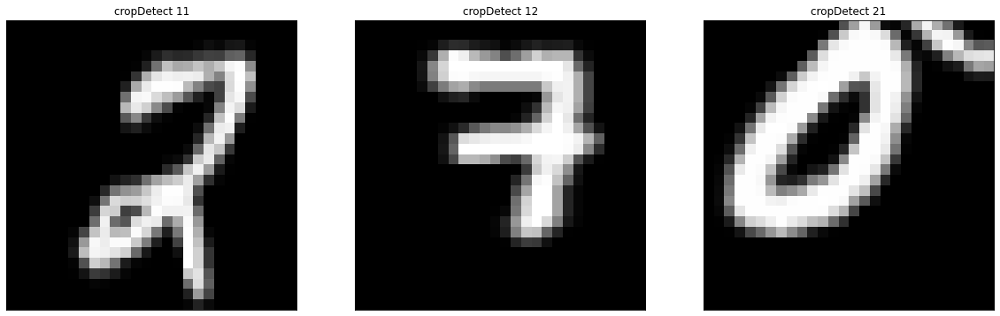

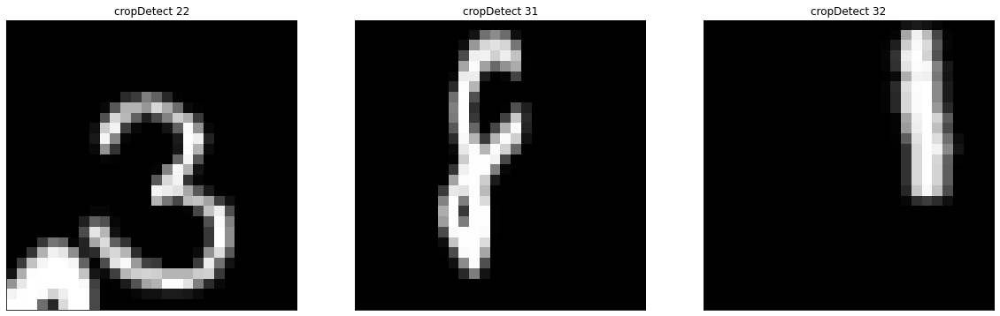

cropDetect 11 prediction: tensor(2)
cropDetect 12 prediction: tensor(3)
cropDetect 21 prediction: tensor(9)
cropDetect 22 prediction: tensor(2)
cropDetect 31 prediction: tensor(6)
cropDetect 32 prediction: tensor(7)


In [89]:
#1.11: Using the trained CNN, detect (i.e., you have to display two digits in each image) the digits in 64 × 64 pixeled images (see figure 2) 
#-‘detect1.png’, ‘detect2.png’ and ‘detect3.png’. Explain your results.

#Load images
detect1 = cv2.imread(path+'detect1.png') #BGR image
detect1 = cv2.cvtColor(detect1, cv2.COLOR_BGR2RGB)

detect2 = cv2.imread(path+'detect2.png') #BGR image
detect2 = cv2.cvtColor(detect2, cv2.COLOR_BGR2RGB)

detect3 = cv2.imread(path+'detect3.png') #BGR image
detect3 = cv2.cvtColor(detect3, cv2.COLOR_BGR2RGB)

#FIRST STEP OF PREPROCESSING -> CONVERT TO BLACK AND WHITE
detect1 = cv2.cvtColor(detect1, cv2.COLOR_BGR2GRAY)
detect2 = cv2.cvtColor(detect2, cv2.COLOR_BGR2GRAY)
detect3 = cv2.cvtColor(detect3, cv2.COLOR_BGR2GRAY)

#SECOND STEP OF PREPROCESSING -> CROPPING THE 3 IMAGES INTO 6 IMAGES
cropDetect11 = detect1[12:34,0:33]
cropDetect12 = detect1[20:50,30:50]

cropDetect21 = detect2[33:60,2:32]
cropDetect22 = detect2[10:40,12:50]

cropDetect31 = detect3[3:27,0:50]
cropDetect32 = detect3[30:70,15:40]


#THIRD STEP OF PREPROCESSING -> RESIZE IMAGE TO CORRECT DIMENSIONS
# print("Size of test 1:", test1.shape)
# print("Size of test 2:", test2.shape)
# print("Size of test 3:", test3.shape)

#dim is (width, height)
cropDetect11 = cv2.resize(cropDetect11, (28,28))
cropDetect12 = cv2.resize(cropDetect12, (28,28))

cropDetect21 = cv2.resize(cropDetect21, (28,28))
cropDetect22 = cv2.resize(cropDetect22, (28,28))

cropDetect31 = cv2.resize(cropDetect31, (28,28))
cropDetect32 = cv2.resize(cropDetect32, (28,28))

# # print("Size of test 1:", test1.shape)
# # print("Size of test 2:", test2.shape)
# # print("Size of test 3:", test3.shape)

#Display
plt.figure(figsize=(20,20))
plt.subplot(131), plt.imshow(cropDetect11, cmap="gray")
plt.title("cropDetect 11"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(cropDetect12, cmap="gray")
plt.title("cropDetect 12"), plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(cropDetect21, cmap="gray")
plt.title("cropDetect 21"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(20,20))
plt.subplot(231), plt.imshow(cropDetect22, cmap="gray")
plt.title("cropDetect 22"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(cropDetect31, cmap="gray")
plt.title("cropDetect 31"), plt.xticks([]), plt.yticks([])
plt.subplot(233), plt.imshow(cropDetect32, cmap="gray")
plt.title("cropDetect 32"), plt.xticks([]), plt.yticks([])
plt.show()


d11 = torch.tensor(cropDetect11, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)
d12 = torch.tensor(cropDetect12, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)

d21 = torch.tensor(cropDetect21, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)
d22 = torch.tensor(cropDetect22, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)

d31 = torch.tensor(cropDetect31, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)
d32 = torch.tensor(cropDetect32, dtype=torch.float32).unsqueeze(dim=0).unsqueeze(dim=0).to(device)

# with torch.no_grad():
#     correct = 0
#     total = 0
#     for images, labels in testloader:
#         outputs = net(images)
#         _, predicted = torch.max(outputs.data, 1)
#         total += labels.size(0)
#         correct += (predicted == labels).sum().item()

#     print('Accuracy of the model on the test images: {} %'.format(100 * correct / total))

label11 = net(d11)
label12 = net(d12)

label21 = net(d21)
label22 = net(d22)

label31 = net(d31)
label32 = net(d32)

_, label11 = torch.max(label11, 1)
_, label12 = torch.max(label12, 1)

_, label21 = torch.max(label21, 1)
_, label22 = torch.max(label22, 1)

_, label31 = torch.max(label31, 1)
_, label32 = torch.max(label32, 1)


print("cropDetect 11 prediction:", label11[0])
print("cropDetect 12 prediction:", label12[0])

print("cropDetect 21 prediction:", label21[0])
print("cropDetect 22 prediction:", label22[0])

print("cropDetect 31 prediction:", label31[0])
print("cropDetect 32 prediction:", label32[0])


**Once again, we can see that the developped CNN has a difficult time predicting and giving accurate labels to images that come from an outter source. Indeed, even after cropping each image and making sure that only one digit would be able to appear per cropped image, the CNN only gets 1 prediction right out of 6 although its accuracy on the MNIST set is of about 97%.**

**1.12: Discuss the limitations of your CNN in the context where you CNN will fail to recognize digits. Show any one example.**

As seen in 1.8 and in 1.11, the CNN tends to have a hard time classifying images that are not part of the MNIST dataset. Indeed, even after transforming the images in 1.8 and in 1.11, the classification error remains extremely high. An interesting experiment would be to do one final transformation to the images in both 1.8 and 1.11. This transformation would be to center the numbers in each image, as in the MNIST dataset, all digits seem to be centered and that was the only transformation not done on the additional test set of images and the detect set of images.



## Question 2: Stereo Vision - Epipolar Geometry [25 points]

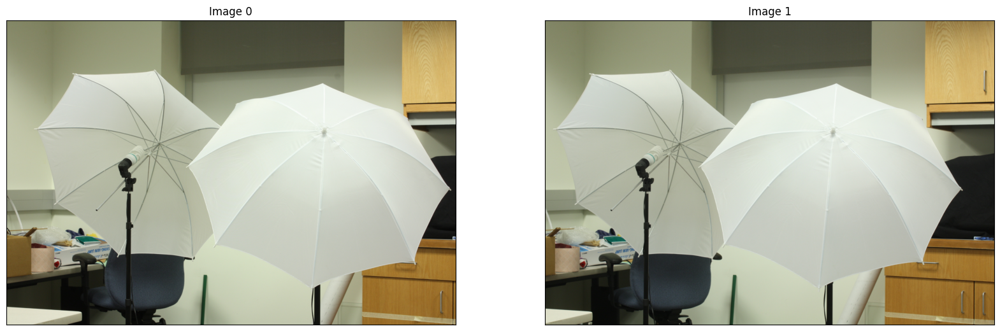

In [47]:
#Import images
img0 = cv2.imread(path+'im0.png') #BGR image
img0 = cv2.cvtColor(img0, cv2.COLOR_BGR2RGB)

img1 = cv2.imread(path+'im1.png') #BGR image
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

#Display
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(img0)
plt.title("Image 0"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img1)
plt.title("Image 1"), plt.xticks([]), plt.yticks([])
plt.show()

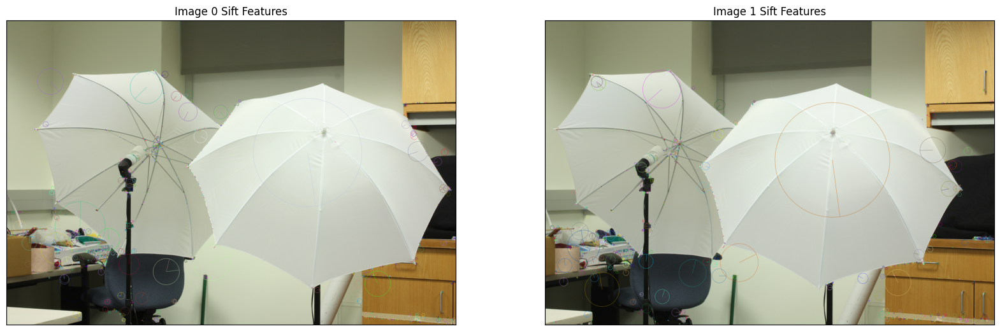

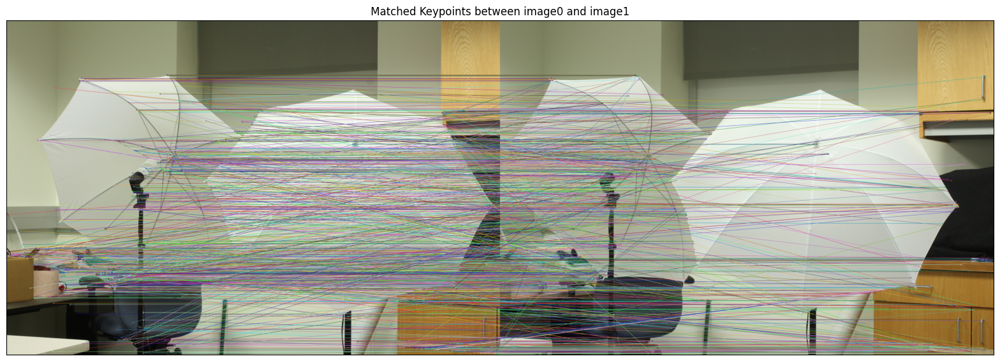

In [48]:
#2.1: Compute matching SIFT keypoints from a stereo image pair. CAN PROBABLY DELETE THIS!
#Code from Tutorial 4 and Assignment 2
sift0 = cv2.xfeatures2d.SIFT_create()
sift1 = cv2.xfeatures2d.SIFT_create()

#Detect SIFT features and descriptors, with no masks
keypoints0, descriptors0 = sift0.detectAndCompute(img0,None)
keypoints1, descriptors1 = sift1.detectAndCompute(img1,None)

#imageCopies
img0Copy = cv2.cvtColor(img0, cv2.COLOR_BGR2RGB)
img1Copy = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

#Draw the keypoints
cv2.drawKeypoints(img0, keypoints0, img0Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img1, keypoints1, img1Copy, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

#Display
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(img0Copy)
plt.title("Image 0 Sift Features"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(img1Copy)
plt.title("Image 1 Sift Features"), plt.xticks([]), plt.yticks([])
plt.show()

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors0,descriptors1) # query image, train image

# Sort them in the order of their distance.
#matches = sorted(matches, key = lambda x:x.distance) #No need to sort the keypoints for this assignment

# Draw keypoints 
imgmatch = cv2.drawMatches(img0,keypoints0,img1,keypoints1, matches, None, flags=2)

plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints between image0 and image1"), plt.xticks([]), plt.yticks([])
plt.show()

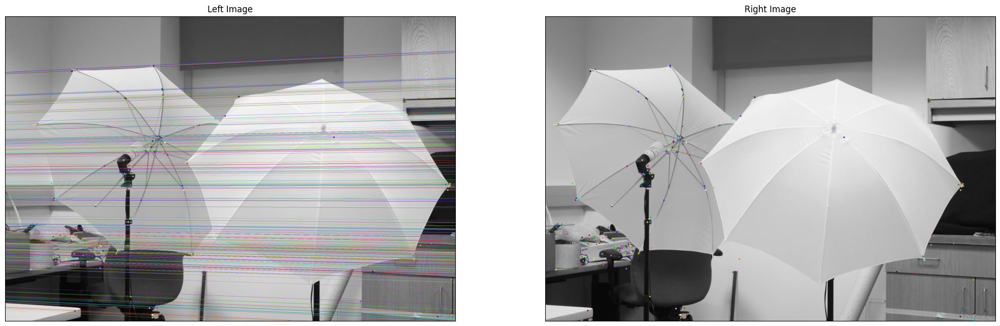

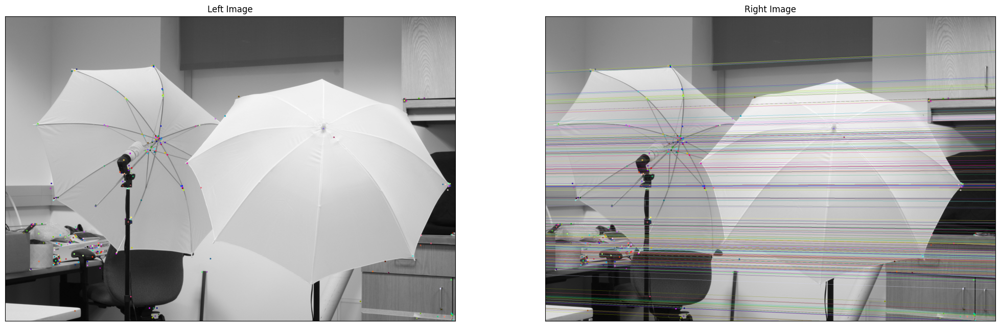

In [49]:
#2.1 and 2.2: Compute matching SIFT keypoints from a stereo image pair and Compute and display the epipolar lines for both images.

#Code from Turotial 10
""" drawlines """
def drawlines(img1, img2, lines, pts1, pts2):
    """
    Draw epilines. Epilines corresponding to the points in 
    the first image are drawn on the second image.
    :param img1: image on which we draw the epilines for the points
            in img2
    :param lines: corresponding epilines
    """
    # img1 shape
    row, col = img1.shape
    # convert from grayscale to BGR
    img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    # for each line
    for r, pt1, pt2 in zip(lines, pts1, pts2):
        # pick a random color
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2]/r[1]])
        x1, y1 = map(int, [col, -(r[2]+r[0]*col)/r[1]])
        # draw the lines and the points
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color, 1)
        img1 = cv2.circle(img1, tuple(pt1), 5, color, -1)
        img2 = cv2.circle(img2, tuple(pt2), 5, color, -1)
    return img1, img2

#Code still from Turotial 10
# load left and right images
imgL = cv2.imread(path+"im0.png", cv2.IMREAD_GRAYSCALE)
imgR = cv2.imread(path+"im1.png", cv2.IMREAD_GRAYSCALE)

# the fundamental matrix
sift = cv2.xfeatures2d.SIFT_create()
# create a Brute-Force Matcher
bfMatcher = cv2.BFMatcher(cv2.NORM_L2)

# find keypoints and descriptors with SIFT
kpL, desL = sift.detectAndCompute(imgL, None)
kpR, desR = sift.detectAndCompute(imgR, None)

# Now, we want to match keypoints and remove matches on repeatative structure.
# match descriptors (find the best two matches for each descriptor)
matches = bfMatcher.knnMatch(desL, desR, k=2) # query image, train image

# ratio test - store the list of best matches from both images
good = []
ptsL = []
ptsR = []
for i, (m, n) in enumerate(matches):
    if m.distance < 0.6 * n.distance:
        good.append(m)
        ptsR.append(kpR[m.trainIdx].pt)
        ptsL.append(kpL[m.queryIdx].pt)

# find the Fundamental Matrix
ptsL = np.int32(ptsL)
ptsR = np.int32(ptsR)
F, mask = cv2.findFundamentalMat(ptsL, ptsR, cv2.FM_LMEDS) # least-median algorithm
# epipolar line in Right image = F ptsL (matrix multiplication)
# epipolar line in Left image = F' ptsR (matrix multiplication)


# Use only inliers for remaining computations
ptsL = ptsL[mask.ravel()==1]
ptsR = ptsR[mask.ravel()==1]

# find epilines
# Epilines corresponding to points in the first image is drawn on the
# second image
linesL = cv2.computeCorrespondEpilines(ptsR, 2, F)
linesL = linesL.reshape(-1, 3)
# draw lines
imgL1, imgR1 = drawlines(imgL, imgR, linesL, ptsL, ptsR)

linesR = cv2.computeCorrespondEpilines(ptsL, 1, F)
linesR = linesR.reshape(-1, 3)
# draw lines
imgR2, imgL2 = drawlines(imgR, imgL, linesR, ptsR, ptsL)

# display images
plt.figure(figsize=(25,25))
plt.subplot(121), plt.imshow(imgL1, cmap="gray")
plt.title("Left Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(imgR1, cmap="gray")
plt.title("Right Image"), plt.xticks([]), plt.yticks([])
plt.figure(figsize=(25,25))
plt.subplot(121), plt.imshow(imgL2, cmap="gray")
plt.title("Left Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(imgR2, cmap="gray")
plt.title("Right Image"), plt.xticks([]), plt.yticks([])
plt.show()


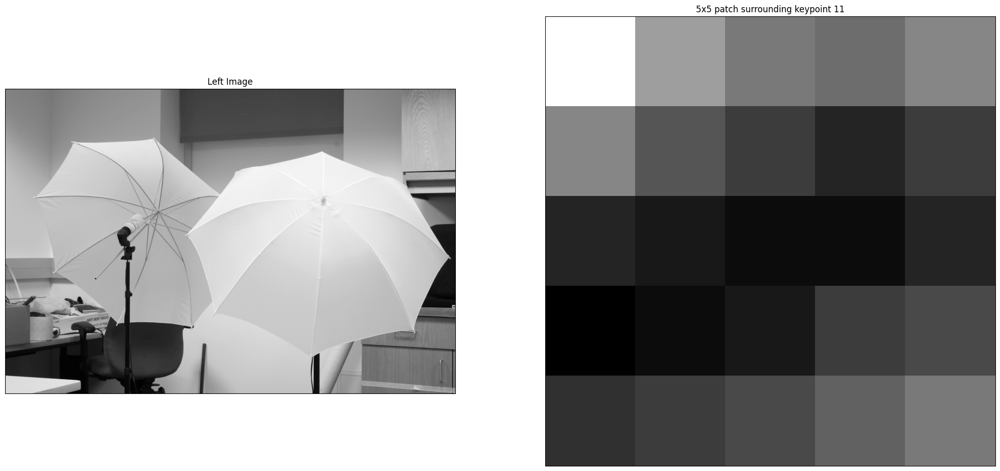

In [50]:
#2.3: Pick any one keypoint in the left image which has a correct match in the right image, and is on the corresponding epipolar line. 
# Extract a patch of size (5 × 5) around this keypoint in the left image.

#Chosen keypoint, no reason for the choice, just randomized
randomKeypoint = ptsL[11]

#Get Patch center
patchCenter = [randomKeypoint[0], randomKeypoint[1]]
#print(patchCenter)

#Add 2.5 pixels to left and right, as well as add 2.5 pixels to top and bottom of the patchCenter
#First index is rows so y value, second index is column so x value
FiveByFivePatch = imgL[(patchCenter[1] - (5//2)) : (patchCenter[1] + (5 - 5//2)), (patchCenter[0] - (5//2)) : (patchCenter[0] + (5 - 5//2))]

# display images
plt.figure(figsize=(25,25))
plt.subplot(121), plt.imshow(imgL, cmap="gray")
plt.title("Left Image"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(FiveByFivePatch, cmap="gray")
plt.title("5x5 patch surrounding keypoint 11"), plt.xticks([]), plt.yticks([])
plt.show()


In [51]:
#2.4:Match the extracted patch to every 5 × 5 patch along the corresponding epipolar line in the right image. 
#Use normalized cross-correlation metric for matching.

x = patchCenter[0]
y = patchCenter[1]
patches = []

#Left and Right image have the same shape
height = imgL.shape[0] 
width = imgL.shape[1]

for col in range(2, width-3):
    patch = imgR[y-2:y+3,col-2:col+3]
    patches.append(patch)

max_vals = []
    
for p in patches:
    res = cv2.matchTemplate(p, FiveByFivePatch, cv2.TM_CCORR_NORMED)
    _, max_val, _, _ = cv2.minMaxLoc(res)
    max_vals.append(max_val)
    
max_index = max_vals.index(max(max_vals))
best_match = patches[max_index]






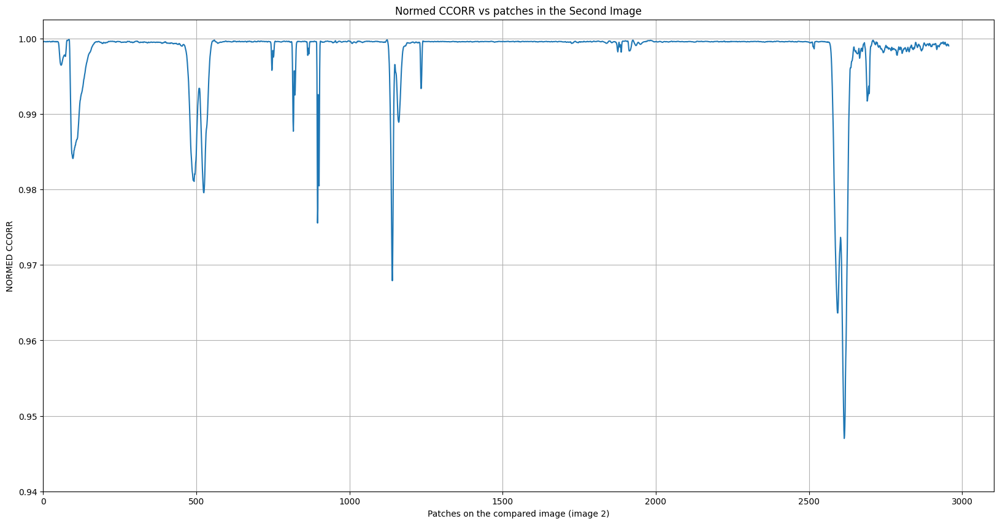

Best matched: 83


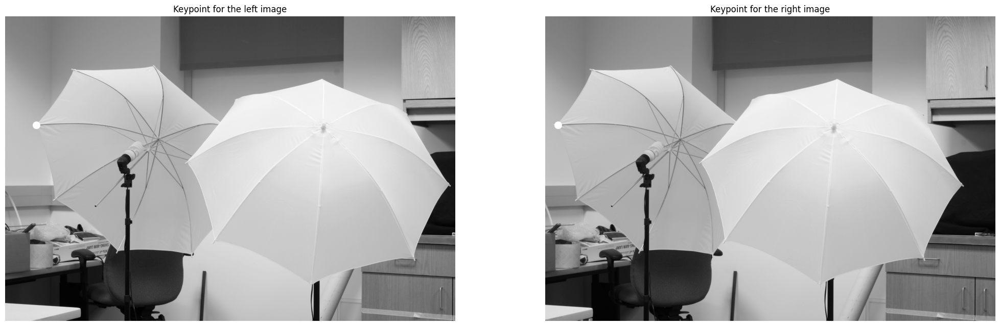

In [55]:
#2.5: Plot normalized cross-correlation values (on the y-axis) against an index of the patch in the left image (on the x-axis). 
#Find the matching points with the maximum normalized cross-correlation value. Display found matching points in both images.

max_index = max_vals.index(max(max_vals))
best_match = patches[max_index]

imgL_Copy = imgL.copy()
pointL = cv2.circle(imgL_Copy, tuple(patchCenter), 25, (255, 0, 0), -1)

# Plot Normed CCORR Values
patch_size = (5, 5)

plt.figure(figsize=(20,10))
plt.title("Normed CCORR vs patches in the Second Image")
plt.xlabel("Patches on the compared image (image 2)")
plt.ylabel("NORMED CCORR")
x_axis = range(patch_size[0] // 2, imgR.shape[1] - patch_size[1] // 2 - 1)
plt.plot(x_axis, max_vals)
plt.ylim(ymin=0.94), plt.xlim(xmin=0)
plt.grid(True)
plt.show()

print("Best matched:", max_index)

best_match_patch_center = (max_index+5//2, y)

# mark keypoint in right image
pointR = cv2.circle(imgR.copy(), tuple(best_match_patch_center), 25, (255, 0, 0), -1)

# Display patches
plt.figure(figsize=(25,25))
plt.subplot(121), plt.title('Keypoint for the left image')
plt.imshow(pointL, cmap="gray"), plt.axis('off')
plt.subplot(122), plt.title('Keypoint for the right image'), plt.xticks([]), plt.yticks([])
plt.imshow(pointR, cmap="gray"), plt.axis('off')
plt.show()



2.6: Are the matching points you found the correct ones? Explain.

It seems that the matching point that we found in the right image is the correct one as both points in the left and right image seem to be at more or less the exact same spot. These two points are the points with the highest correlation.

## Question 3: Motion Algorithm [12 points]

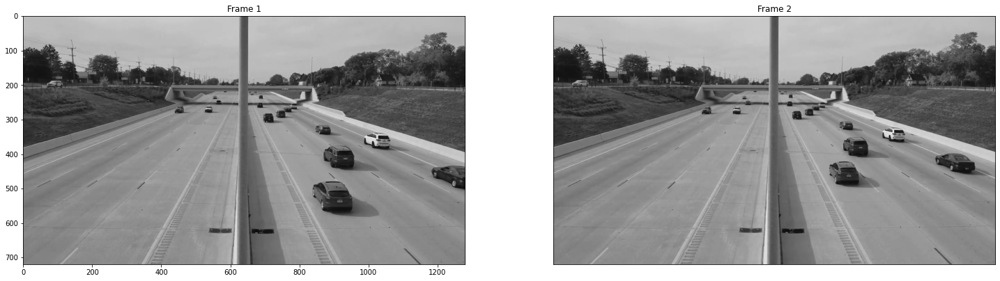

In [4]:
#Import images

#A lot of this code is from Tutorial 11, where we went over how to use the Lucas-Kanade Optic Flow detection

import cv2
import numpy as np
import matplotlib.pyplot as plt

# read images
img1 = cv2.imread(path+"frame1.png")
img2 = cv2.imread(path+"frame2.png")

# convert to grayscale
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#Display images
plt.figure(figsize=(25,25))
plt.subplot(121), plt.title('Frame 1')
plt.imshow(img1_gray, cmap="gray")
plt.subplot(122), plt.title('Frame 2'), plt.xticks([]), plt.yticks([])
plt.imshow(img2_gray, cmap="gray")
plt.show()

In [9]:
#3.1: Extract good points to track from ‘frame1.png’ using Harris corner detection algorithm. Use openCV function goodFeaturesToTrack and set parameter value maxCorners=500. 
#Search optimal values for the rest of the parameters. Let us call the detected set of points: p1.

# find good corners in the first image
# Ref: https://docs.opencv.org/master/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541
# Parameters
#          image	Input 8-bit or floating-point 32-bit, single-channel image.
#          corners	Output vector of detected corners.
#          maxCorners	Maximum number of corners to return. If there are more corners than are found, the strongest of them is returned. maxCorners <= 0 implies that no limit on the maximum is set and all detected corners are returned.
#          qualityLevel	Parameter characterizing the minimal accepted quality of image corners. 
#                       The parameter value is multiplied by the best corner quality measure, 
#                       which is the minimal eigenvalue (see cornerMinEigenVal ) or the Harris function response (see cornerHarris ). 
#                       The corners with the quality measure less than the product are rejected. 
#                       For example, if the best corner has the quality measure = 1500, 
#                       and the qualityLevel=0.01 , 
#                       then all the corners with the quality measure less than 15 are rejected.
#          minDistance	Minimum possible Euclidean distance between the returned corners.
#          mask	Optional region of interest. If the image is not empty (it needs to have the type CV_8UC1 and the same size as image ), it specifies the region in which the corners are detected.
#          blockSize	Size of an average block for computing a derivative covariation matrix over each pixel neighborhood. See cornerEigenValsAndVecs .
#          useHarrisDetector	Parameter indicating whether to use a Harris detector (see cornerHarris) or cornerMinEigenVal.
#          k	Free parameter of the Harris detector. 

# parameters for Corner Detection, All parameters were chosen based on the results in the tutorial.
feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.2,
                       minDistance = 7,
                       blockSize = 7,
                      useHarrisDetector=True )


p0 = cv2.goodFeaturesToTrack(img1_gray, **feature_params)

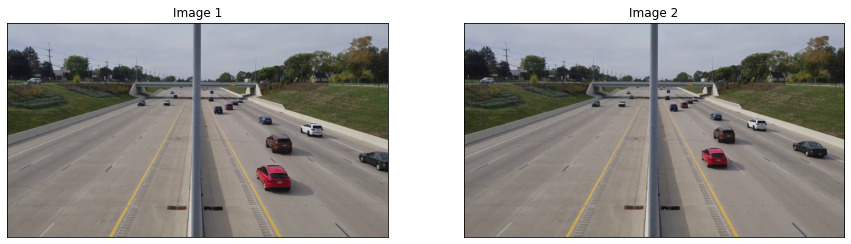

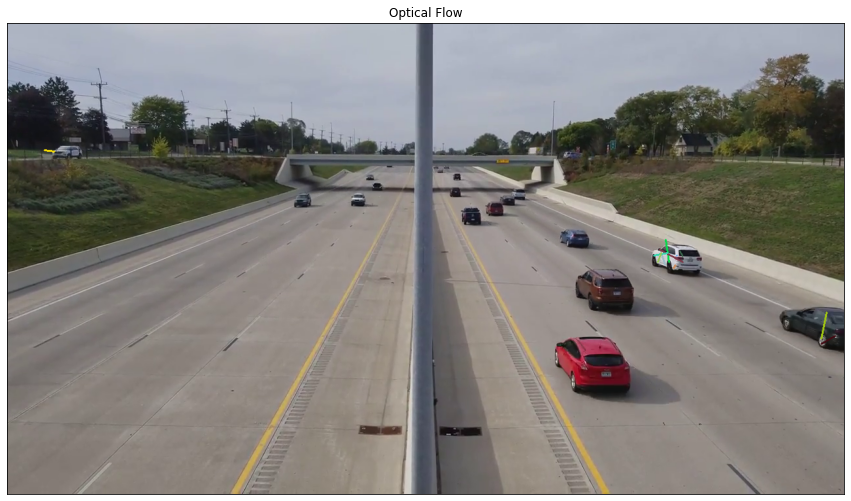

Mean error :  55.43585235422308


In [10]:
#3.2: Compute the optical flow between ‘frame1.png’and‘frame2.png’at the points in p1.Use the
#openCV function calcOpticalFlowPyrLK. Search for optimal values for the parameters.

# calculate optical flow
# https://docs.opencv.org/master/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323
# Parameters
#          prevImg	first 8-bit input image or pyramid constructed by buildOpticalFlowPyramid.
#          nextImg	second input image or pyramid of the same size and the same type as prevImg.
#          prevPts	vector of 2D points for which the flow needs to be found; 
#                   point coordinates must be single-precision floating-point numbers.
#          nextPts	output vector of 2D points (with single-precision floating-point coordinates) 
#                   containing the calculated new positions of input features in the second image; 
#                   when OPTFLOW_USE_INITIAL_FLOW flag is passed, the vector must have the same size as in the input.
#          status	output status vector (of unsigned chars); 
#                   each element of the vector is set to 1 if the flow for the corresponding features has been found, 
#                   otherwise, it is set to 0.
#          err	output vector of errors; each element of the vector is set to an error for the corresponding feature, 
#               type of the error measure can be set in flags parameter; 
#               if the flow wasn't found then the error is not defined (use the status parameter to find such cases).
#          winSize	size of the search window at each pyramid level.
#          maxLevel	0-based maximal pyramid level number; if set to 0, pyramids are not used (single level), 
#                   if set to 1, two levels are used, and so on; 
#                   if pyramids are passed to input then algorithm will use as many levels as pyramids have but no more than maxLevel.
#          criteria	parameter, specifying the termination criteria of the iterative search algorithm 
#                   (after the specified maximum number of iterations criteria.maxCount or 
#                    when the search window moves by less than criteria.epsilon.
#          flags	operation flags:
#                   OPTFLOW_USE_INITIAL_FLOW: uses initial estimations, stored in nextPts; 
#                                             if the flag is not set, then prevPts is copied to nextPts 
#                                             and is considered the initial estimate.
#                   OPTFLOW_LK_GET_MIN_EIGENVALS: use minimum eigen values as an error measure 
#                                                 (see minEigThreshold description); 
#                                                 if the flag is not set, 
#                                                 then L1 distance between patches around the original 
#                                                 and a moved point, divided by number of pixels in a window, 
#                                                 is used as a error measure.
#          minEigThreshold	the algorithm calculates the minimum eigen value of a 2x2 normal matrix of 
#                           optical flow equations (this matrix is called a spatial gradient matrix in [25]), 
#                           divided by number of pixels in a window; 
#                           if this value is less than minEigThreshold, 
#                           then a corresponding feature is filtered out and its flow is not processed, 
#                           so it allows to remove bad points and get a performance boost.

# parameters for lucas kanade optical flow
lk_params = dict( winSize = (10,10),
                  maxLevel = 1,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                             10, 0.03))

p1, st, err = cv2.calcOpticalFlowPyrLK(img1_gray, img2_gray, p0, None, **lk_params)

# select good points
good_new = p1[st==1]
good_old = p0[st==1]


# meanerr = []
# mean = np.mean(err)
# meanerr.append(mean)

# print("Error Mean: ", mean)

# create some random colors
color = np.random.randint(0, 255, (good_new.shape[0], 3))

# create a mask image for drawing purposes
mask = img1.copy()

# draw the tracks
for i, (new, old) in enumerate(zip(good_new, good_old)):
    a, b = new.ravel()
    c, d = old.ravel()
    #mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 2)
    mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)

#3.2: Display the optical flow image.
# display images
plt.figure(figsize=(15,15))
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title("Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title("Image 2"), plt.xticks([]), plt.yticks([])
plt.figure(figsize=(15,15))
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
plt.title("Optical Flow"), plt.xticks([]), plt.yticks([])
plt.show()

#calculate mean of tracking error
good_err = err[st==1]
mean_err = sum(good_err)/len(good_err)
print("Mean error : ", mean_err)


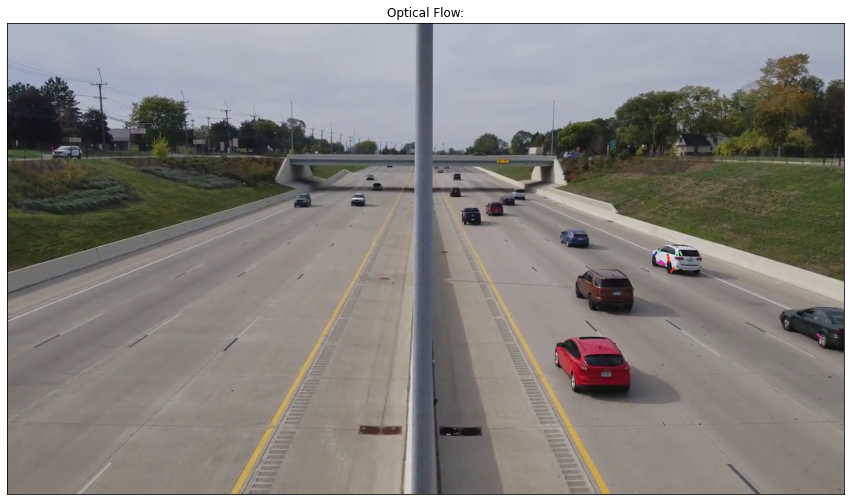

Pyramid Level: 0
Mean error :  64.26926144686612


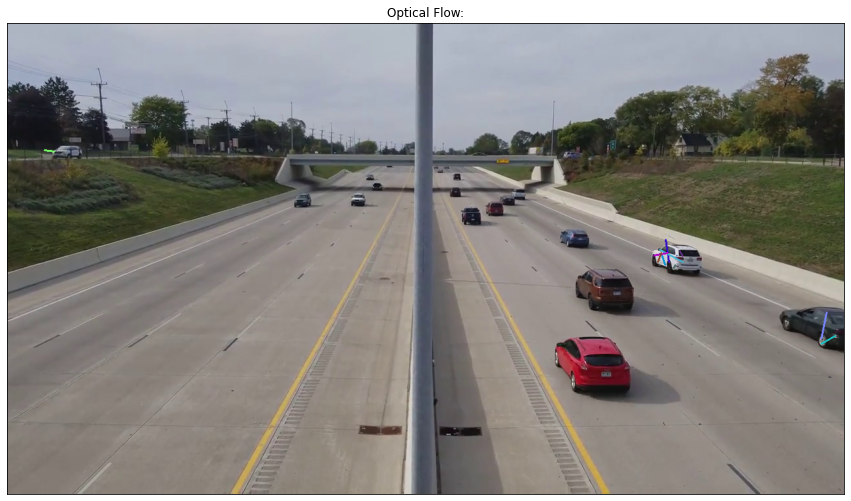

Pyramid Level: 1
Mean error :  55.43585235422308


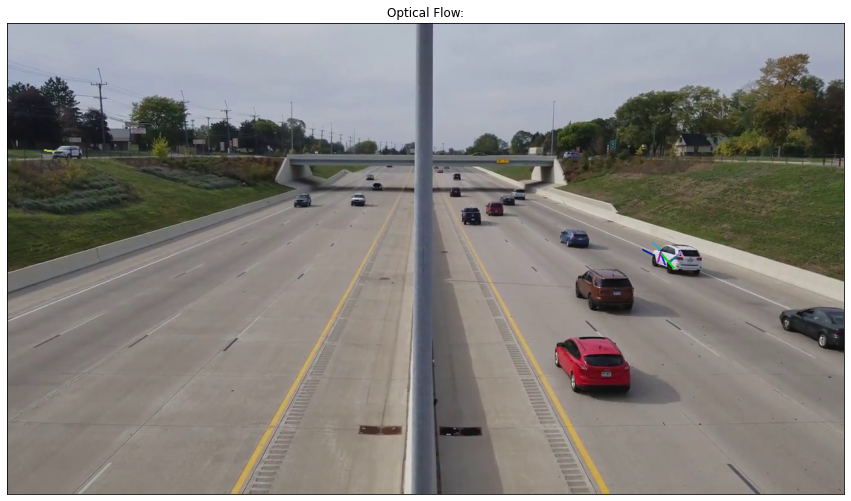

Pyramid Level: 2
Mean error :  57.059966299268936


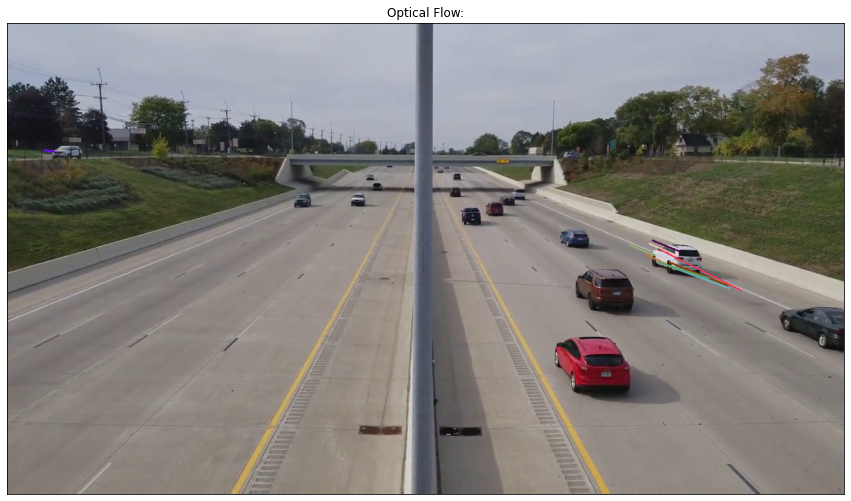

Pyramid Level: 3
Mean error :  34.871458212534584


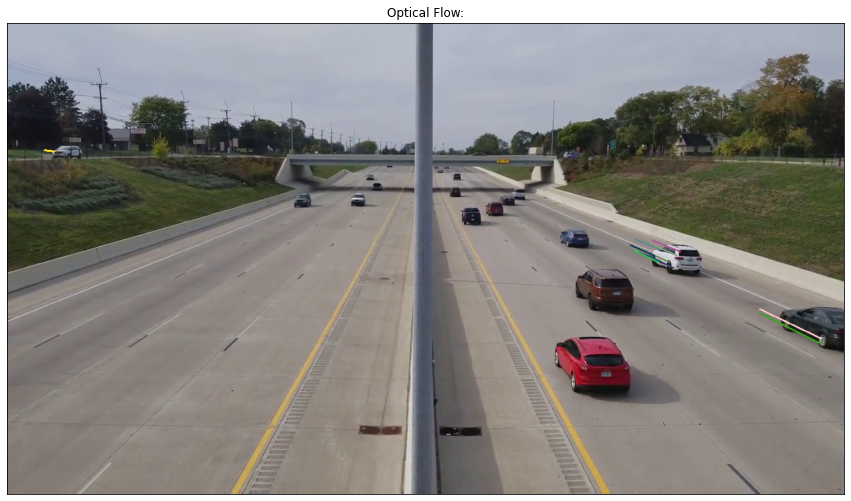

Pyramid Level: 4
Mean error :  11.87142038345337


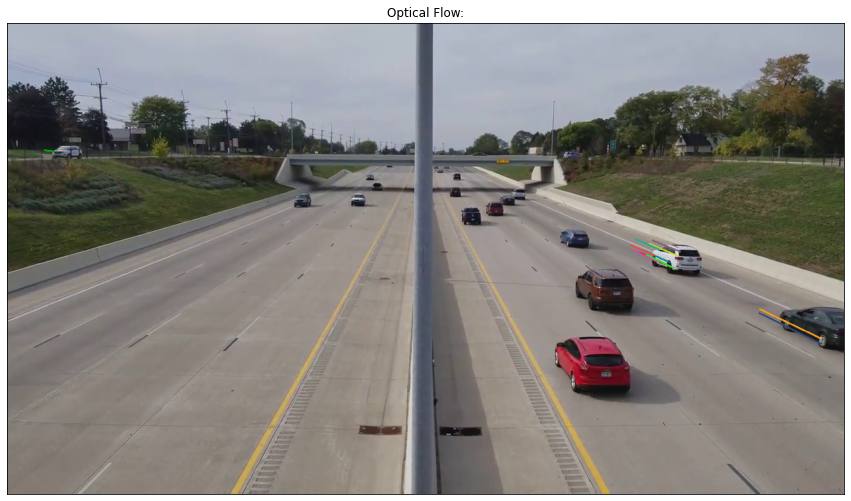

Pyramid Level: 5
Mean error :  11.87142038345337


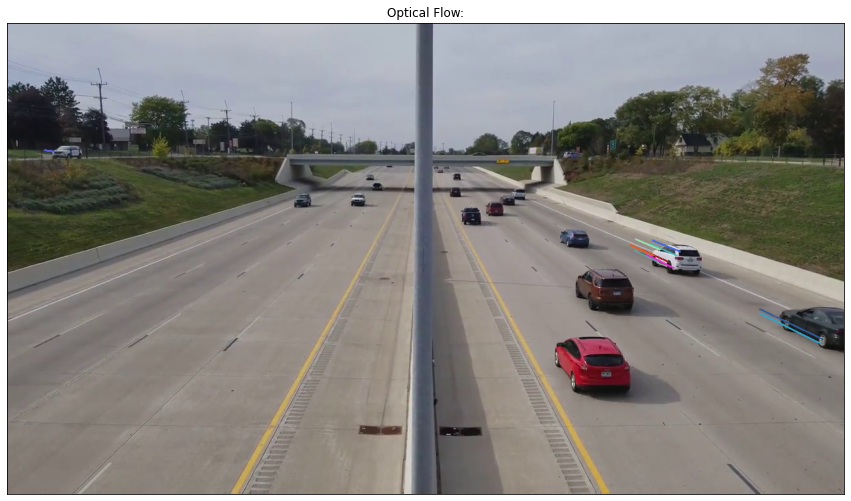

Pyramid Level: 6
Mean error :  11.871477127075195


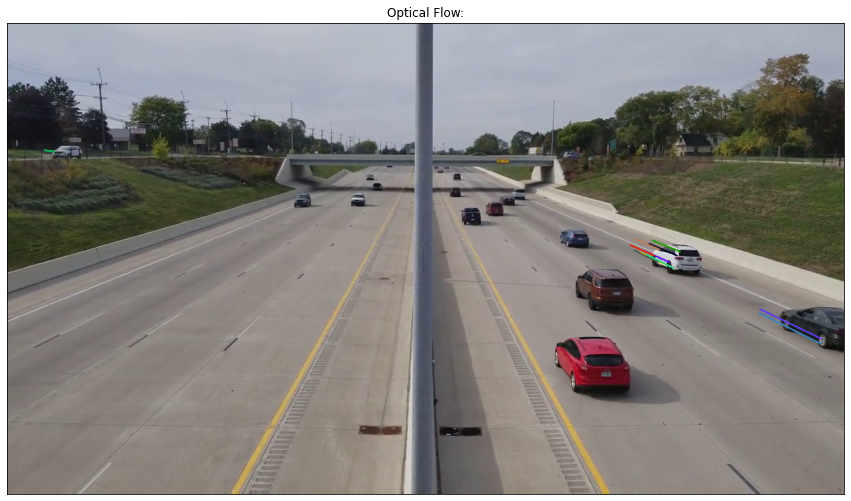

Pyramid Level: 7
Mean error :  11.871477127075195


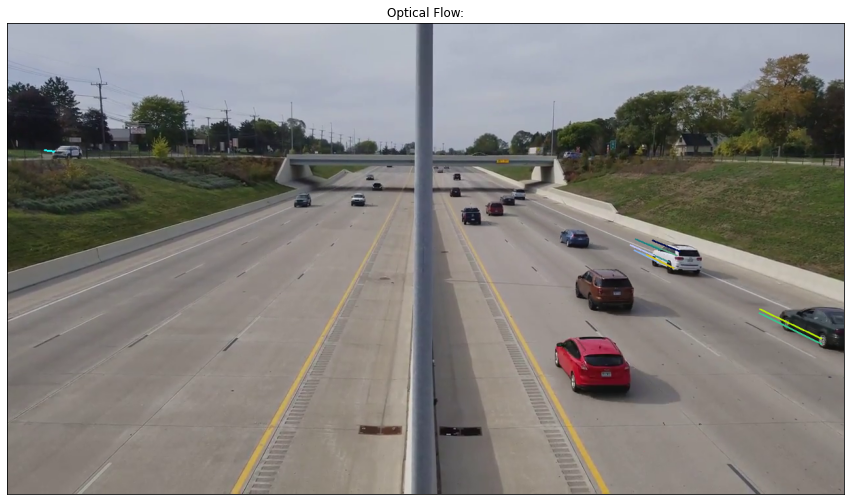

Pyramid Level: 8
Mean error :  11.871477127075195


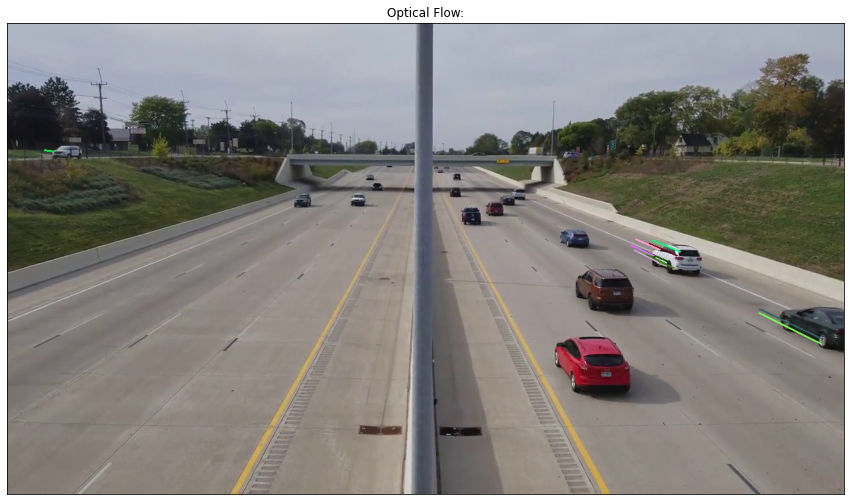

Pyramid Level: 9
Mean error :  11.871477127075195


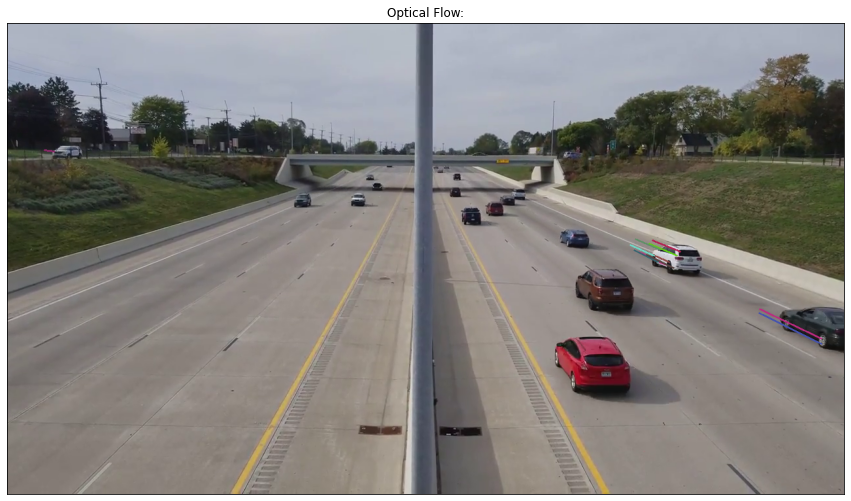

Pyramid Level: 10
Mean error :  11.871477127075195


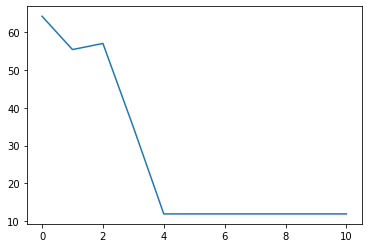

In [115]:
#3.4: Vary the maximum pyramid level from 0 to 10 (in steps of 1) in the function calcOpticalFlowPyrLK. 
#For each setting, compute the mean of the error at those points whose correspondence search is successful i.e. returned status is 1. 
#Plot the mean (on y-axis) vs. pyramid level (on the x-axis). 
#Discuss the trends you observe in the plot.

#Let's make a function to do all 10 levels.

def LKanade(level):
  # parameters for lucas kanade optical flow
  level = level
  lk_params = dict( winSize = (10,10),
                  maxLevel = level,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                             10, 0.03))

  p1, st, err = cv2.calcOpticalFlowPyrLK(img1_gray, img2_gray, p0, None, **lk_params)

  # select good points
  good_new = p1[st==1]
  good_old = p0[st==1]

  # create some random colors
  color = np.random.randint(0, 255, (good_new.shape[0], 3))

  # create a mask image for drawing purposes
  mask = img1.copy()

  # draw the tracks
  for i, (new, old) in enumerate(zip(good_new, good_old)):
      a, b = new.ravel()
      c, d = old.ravel()
      #mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 2)
      mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)

  #3.2: Display the optical flow image.
  # display images
  plt.figure(figsize=(15,15))
  plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
  plt.title("Optical Flow:"), plt.xticks([]), plt.yticks([])
  plt.show()

  print("Pyramid Level:", level)

  #calculate mean of tracking error
  good_err = err[st==1]
  mean_err = sum(good_err)/len(good_err)
  print("Mean error : ", mean_err)

  return mean_err

errors = []
levels = []
for k in range(11):
  errors.append(LKanade(k))
  levels.append(k)
  
#DRAW THE GRAPHS FOR THE PYRAMIDS LEVELS AND ERROR RATES RELATIONSHIP
plt.plot(levels, errors)
plt.show()

As the pyramid level increases, the error rate decreases. However, for levels 4 to 10, we can see that the error rate stops to significantly decrease and we hit a plateau for our error rate.